In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.feature_selection import SelectKBest # selects the top K features based on a given scoring function
from sklearn.feature_selection import chi2

In [2]:
data = pd.read_csv("train.csv")
X = data.iloc[:,0:20]  #independent columns
y = data.iloc[:,-1]    #target column i.e price range

#### preprocessing

In [7]:
from ydata_profiling import ProfileReport

In [8]:
profile = ProfileReport(data, title="Profiling Report")

In [9]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

check data type

In [10]:
print(data.dtypes)

#all int or float -> continuous variables

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object


In [11]:
# check for missing value
print(data.isnull().sum())

# no missing value

# if needed, fill missing value
# data.fillna(data.mean(), inplace=True)

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64


In [12]:
# Summary statistics
print(data.describe())

       battery_power       blue  clock_speed     dual_sim           fc  \
count    2000.000000  2000.0000  2000.000000  2000.000000  2000.000000   
mean     1238.518500     0.4950     1.522250     0.509500     4.309500   
std       439.418206     0.5001     0.816004     0.500035     4.341444   
min       501.000000     0.0000     0.500000     0.000000     0.000000   
25%       851.750000     0.0000     0.700000     0.000000     1.000000   
50%      1226.000000     0.0000     1.500000     1.000000     3.000000   
75%      1615.250000     1.0000     2.200000     1.000000     7.000000   
max      1998.000000     1.0000     3.000000     1.000000    19.000000   

            four_g   int_memory        m_dep    mobile_wt      n_cores  ...  \
count  2000.000000  2000.000000  2000.000000  2000.000000  2000.000000  ...   
mean      0.521500    32.046500     0.501750   140.249000     4.520500  ...   
std       0.499662    18.145715     0.288416    35.399655     2.287837  ...   
min       0.00000

In [13]:
data.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


#there is no categorical data
#but there are some highly-correlated variabels -> maybe feature selection later
#1. train model without any transformation of data
#2. feature selection -> train 

In [20]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)

In [23]:
# Init classifier
xgb_cl = XGBClassifier()

# Fit
xgb_cl.fit(X_train, y_train)

# Predict
preds = xgb_cl.predict(X_test)

In [25]:
accuracy_score(y_test, preds)

0.9025

In [26]:
xgb_cl.score(X_test, y_test)

0.9025

Hyper-parameter adjustments

In [27]:
# XGBoost (different learning rate)
learning_rate_range = np.arange(0.01, 1, 0.05)
test_XG = [] 
train_XG = []
for lr in learning_rate_range:
    xgb_classifier = XGBClassifier(eta = lr)
    xgb_classifier.fit(X_train, y_train)
    train_XG.append(xgb_classifier.score(X_train, y_train))
    test_XG.append(xgb_classifier.score(X_test, y_test))

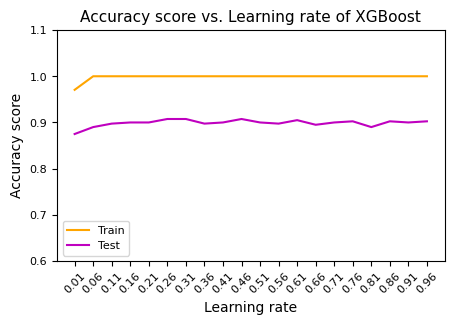

In [35]:
fig = plt.figure(figsize=(5, 3))
plt.plot(learning_rate_range, train_XG, c='orange', label='Train')
plt.plot(learning_rate_range, test_XG, c='m', label='Test')
plt.xlabel('Learning rate')
plt.xticks(learning_rate_range)
plt.xticks(rotation = 45, fontsize = 8)
plt.ylabel('Accuracy score')
plt.ylim(0.6, 1.1)
plt.yticks(fontsize = 8)
plt.legend(prop={'size': 8}, loc=3)
plt.title('Accuracy score vs. Learning rate of XGBoost', size=11)
plt.show()

#### Univariate Selection

#### Feature Selection

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt

[0.06107048 0.01932802 0.03259894 0.01933434 0.0314745  0.01748664
 0.03392957 0.03278933 0.03534605 0.03223844 0.03334015 0.04602298
 0.04865203 0.40240407 0.03336741 0.03389512 0.03515145 0.01414616
 0.0186034  0.01882093]


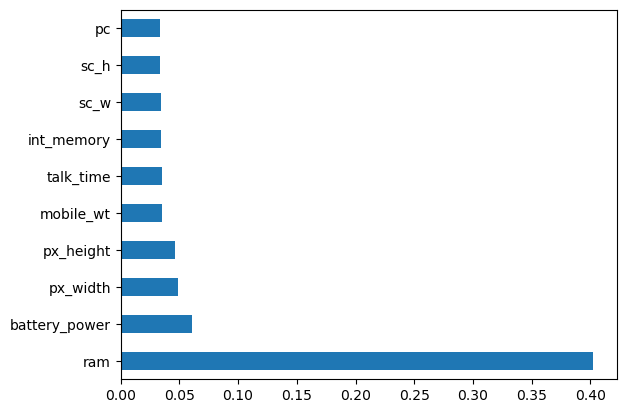

In [ ]:
# ExtraTreesClassifier: 
# It is a variant of the Random Forest algorithm that adds randomness to the tree building process.
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

In [ ]:
feat_importances

battery_power    0.061070
blue             0.019328
clock_speed      0.032599
dual_sim         0.019334
fc               0.031475
four_g           0.017487
int_memory       0.033930
m_dep            0.032789
mobile_wt        0.035346
n_cores          0.032238
pc               0.033340
px_height        0.046023
px_width         0.048652
ram              0.402404
sc_h             0.033367
sc_w             0.033895
talk_time        0.035151
three_g          0.014146
touch_screen     0.018603
wifi             0.018821
dtype: float64

In [ ]:
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
#print(dfscores, dfcolumns)
print(featureScores.nlargest(10,'Score'))  #print 10 best features


            Specs          Score
13            ram  931267.519053
11      px_height   17363.569536
0   battery_power   14129.866576
12       px_width    9810.586750
8       mobile_wt      95.972863
6      int_memory      89.839124
15           sc_w      16.480319
16      talk_time      13.236400
4              fc      10.135166
14           sc_h       9.614878


#### Correlation Matrix with Heatmap

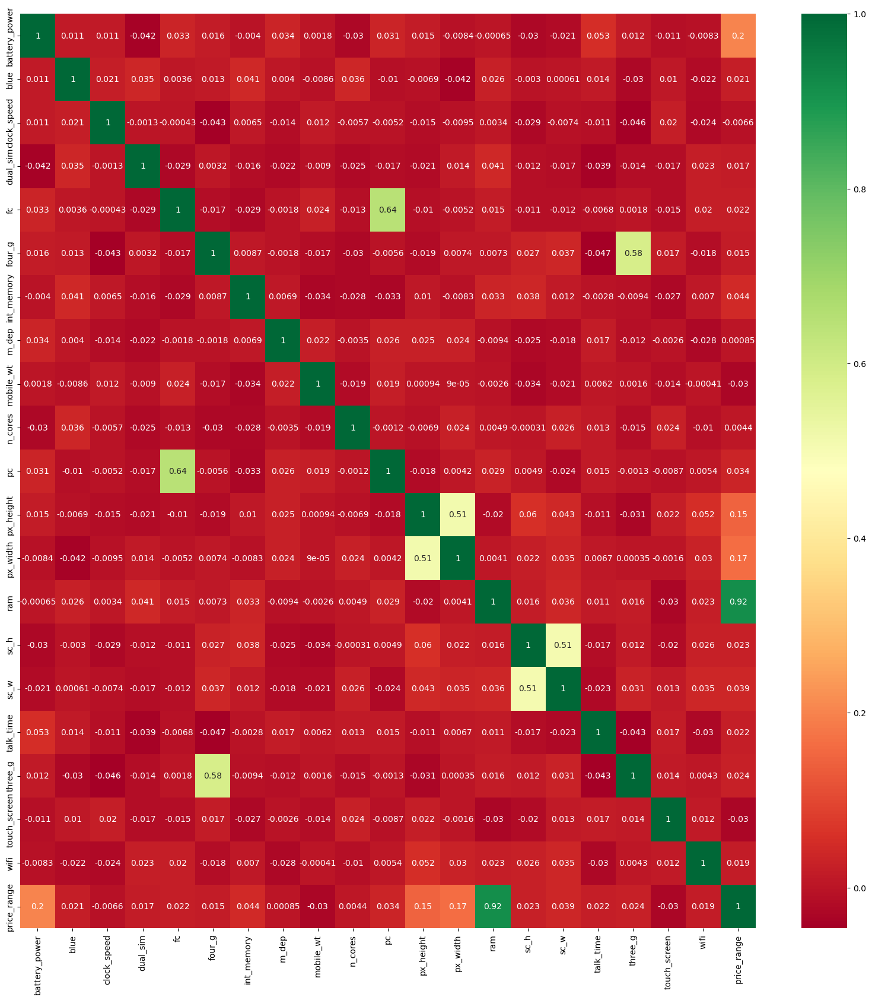

In [ ]:
#get correlations of each features in dataset
corrmat = data.corr()
#print(corrmat)
top_corr_features = corrmat.index
#print(corrmat.index)
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True,cmap="RdYlGn")
#g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

the independent variables which are highly correlated with dependent variable means that they have the same patterns, abd the independent features play crucial roles to affect the target variable. 